# Example of evaluation of a model

In this notebook we evaluate the model for different time intervals and using different measures:
- relBIAS (relative bias): mean of the error normalized by the mean of the observation
- rSD (relative std) : std of the prediction normalized by the std of the observation
- R2: Pearsons squared correlation coefficient iun the time dimension
- KGE: Kling-Gupta Efficiency

In [1]:
import sys
sys.path.append('/'.join(sys.path[0].split('/')[:-1]))

import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import time
import os

from modules.utils import load_test_data
from modules.plotting import (plot_anomalies, assess_month, assess_season, assess_seasonal_cycle, 
                              assess_daily_cycle, assess_globally)

## Data

In [2]:
datadir = "../data/equiangular/"
label_path = datadir + "5.625deg/"
pred_path = datadir + "predictions/"
figure_path = "../figures/model_evaluation/"

lead_time = 72

ds_pred = xr.open_mfdataset(pred_path + 'spherical_unet_3d.nc', combine='by_coords')
ds_label = load_test_data(f'{label_path}', lead_time)
ds_input = load_test_data(f'{label_path}', 0).isel(time=slice(0, -lead_time))

## Figures

## 1. Anomaly displacement

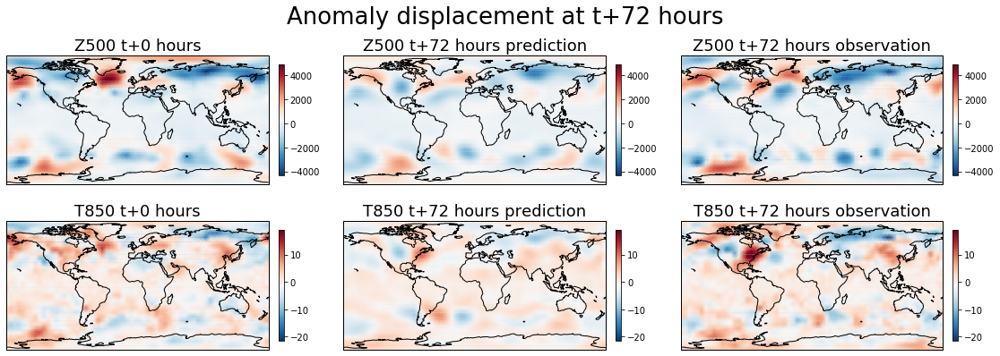

In [3]:
plot_anomalies(ds_input, ds_pred, ds_label, timestep=0, mean='weekly', 
               model_description="spherical_unet_3days", save_path=figure_path)

## 2. Monthly summaries


### 2.1. rSD

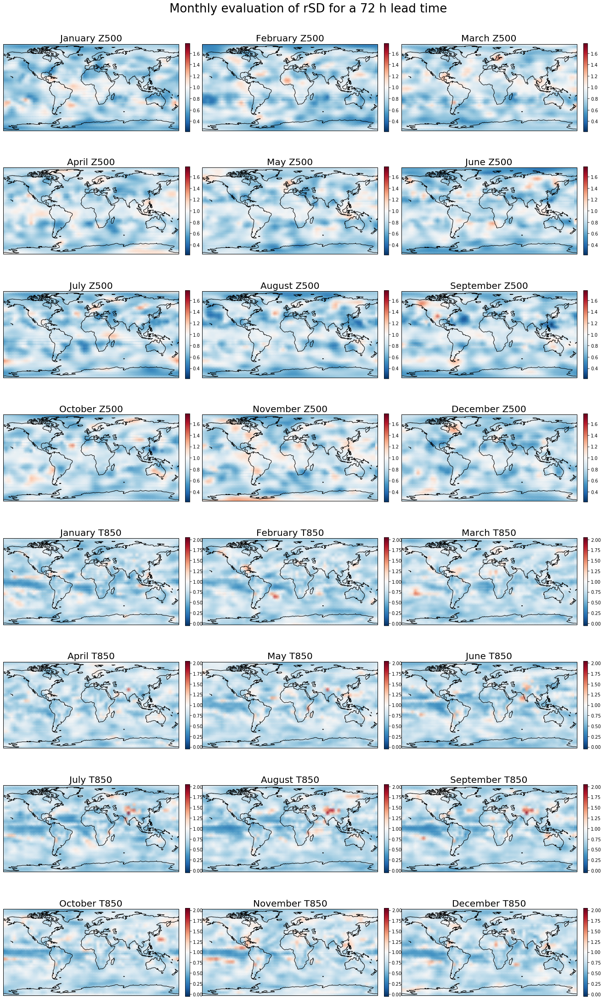

In [4]:
assess_month(ds_pred, ds_label, skill_name='rSD',  model_description="spherical_unet_3days", 
             lead_time=lead_time, save_path=figure_path)

## 3. Seasonal summaries

### 3.1. rSD

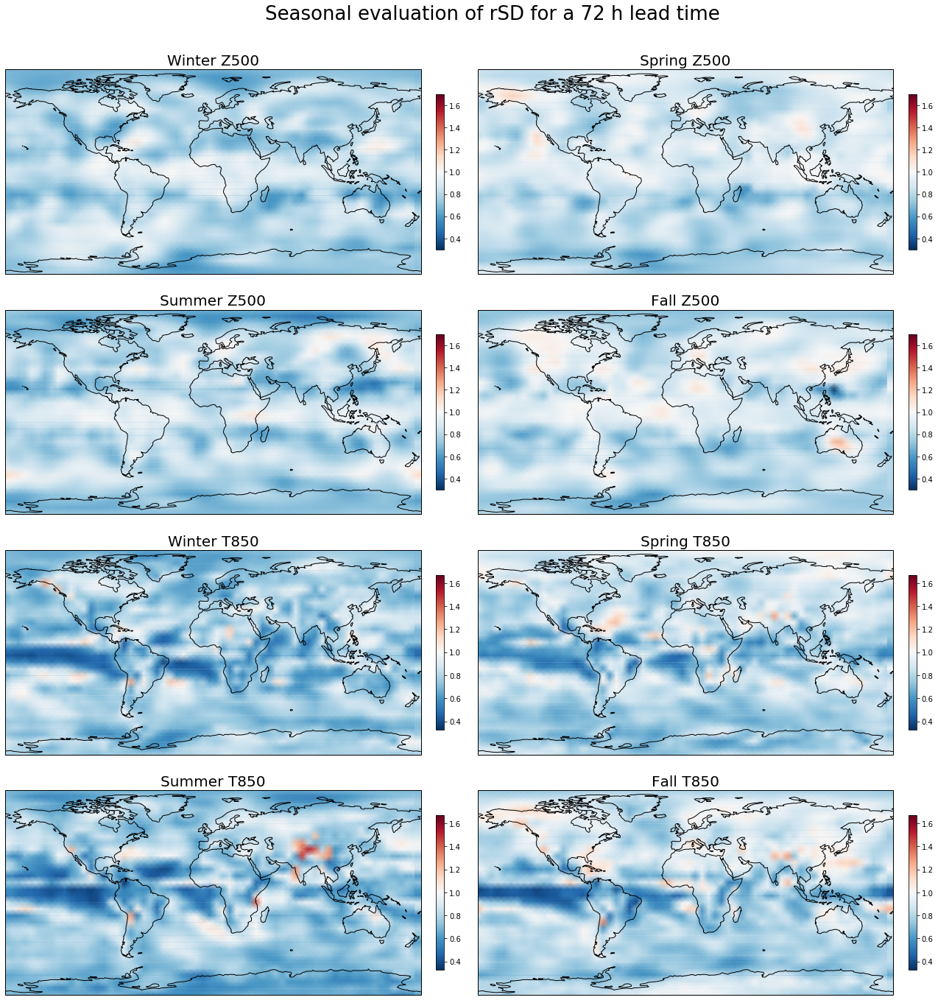

In [5]:
assess_season(ds_pred, ds_label, skill_name='rSD',  model_description="spherical_unet_3days", 
             lead_time=lead_time, save_path=figure_path)

## 4. Global summaries

### 4.1. Seasonal cycle

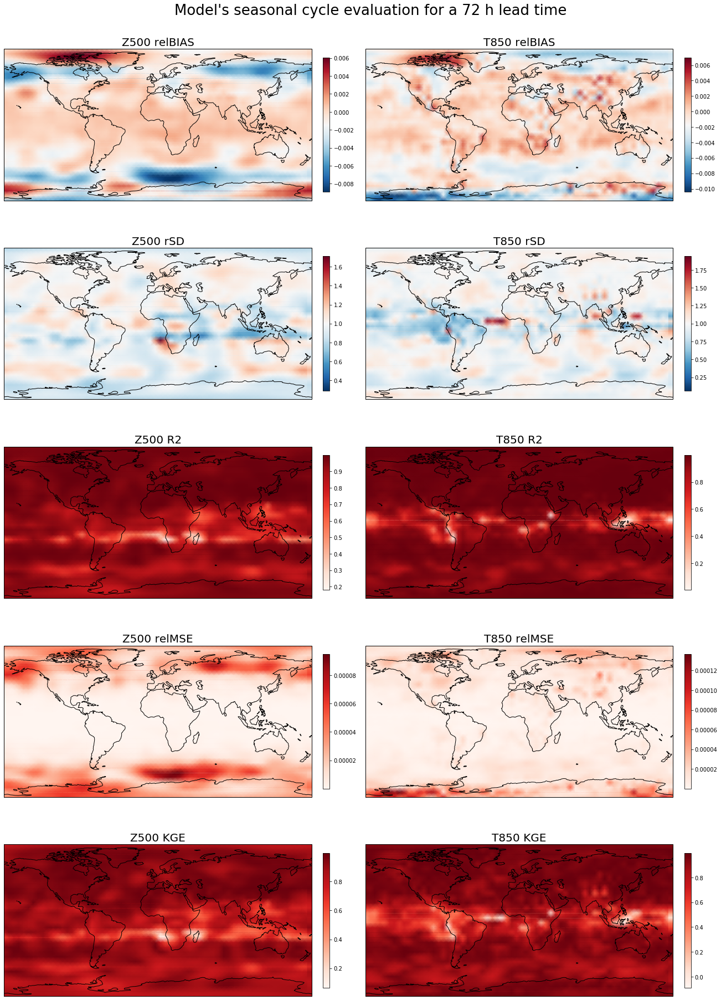

In [6]:
assess_seasonal_cycle(ds_pred, ds_label, model_description="spherical_unet_3days", lead_time=lead_time, 
                      save_path=figure_path)

### 4.2. Daily cycle

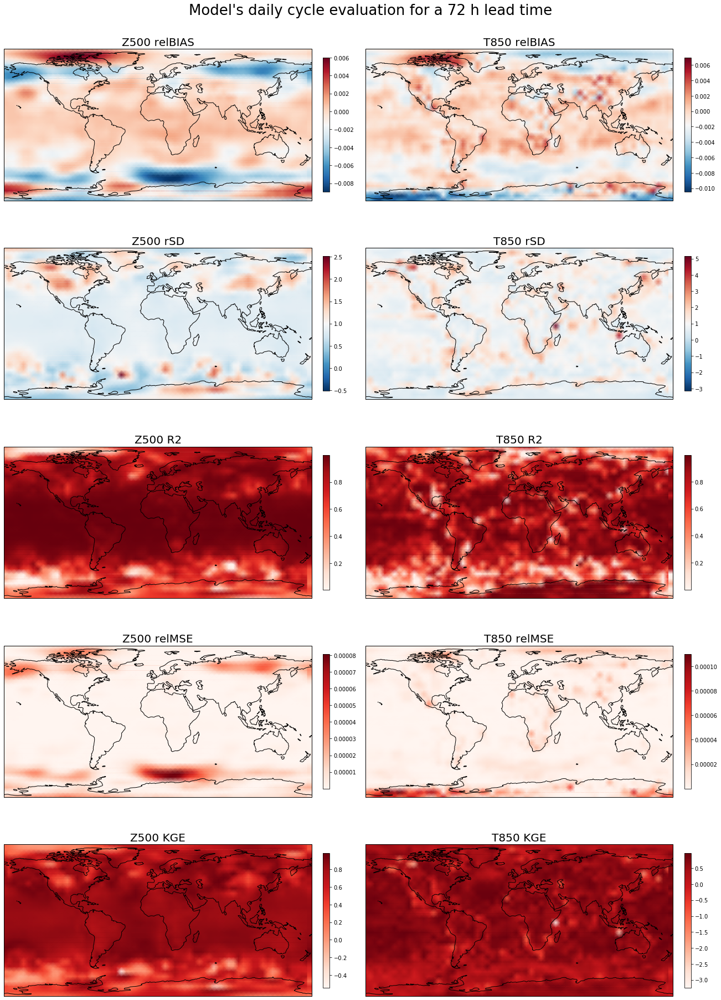

In [7]:
assess_daily_cycle(ds_pred, ds_label, model_description="spherical_unet_3days", lead_time=lead_time, 
                   save_path=figure_path)

### 4.3. Global skills evaluation

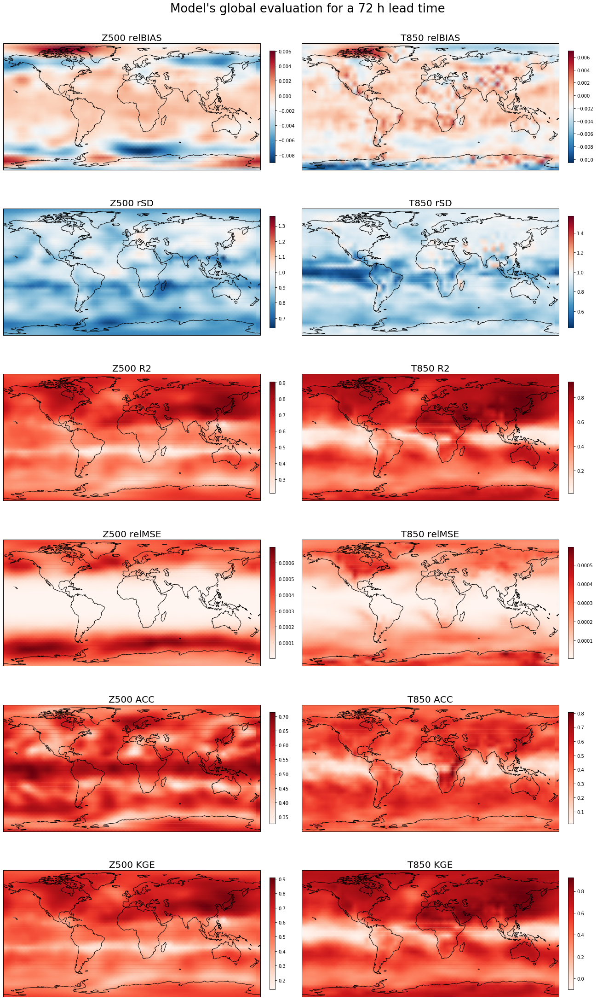

In [8]:
assess_globally(ds_pred, ds_label, model_description="spherical_unet_3days", lead_time=lead_time, 
                save_path=figure_path)

In [10]:
import sys
sys.path.append('/'.join(sys.path[0].split('/')[:-1]))

import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
import time
import os

from modules.utils import load_test_data
from modules.test import compute_anomalies
from modules.plotting import (plot_anomalies, assess_month, assess_season, assess_seasonal_cycle, 
                              assess_daily_cycle, assess_globally)

datadir = "../data/equiangular/"
label_path = datadir + "5.625deg/"
pred_path = datadir + "predictions/"
figure_path = "../figures/model_evaluation/"

lead_time = 72

ds_pred = xr.open_mfdataset(pred_path + 'spherical_unet_3d.nc', combine='by_coords')
ds_label = load_test_data(f'{label_path}', lead_time)
ds_input = load_test_data(f'{label_path}', 0).isel(time=slice(0, -lead_time))

In [15]:
anomalies_pred = compute_anomalies(ds_pred, mean='weekly').drop('week')
anomalies_obs = compute_anomalies(ds_label, mean='weekly').drop('week')

In [17]:
anomalies_pred.to_netcdf(figure_path + "anomalies_pred.nc")

In [18]:
anomalies_obs.to_netcdf(figure_path + "anomalies_obs.nc")